In [32]:
! head -1 example_data.sam

m54048_170205_013231/4194617/ccs	4	*	0	255	*	*	0	0	GGTGGAGTCTTCCTGGGCCTAACCTTCCCTATTAACGAAACCCCAGCACATAAATATACACGCTTCGTGAACTCATTCAAAAGCCCTCAAATTACGTGTTTTTCTTTACCTGGGCAATCTCAAAGCCACGGGCCTTCACCAAGGAGAAGATTGTCTATTGGGACACGCACATTTTCAAAGACGATTTCTGCGTGCCCATGAGGAGCATCATCAAACCCAAAGACTCTCAACGGACGTACAATGCGAACACCTGGAGCATCCATTTCAGCCAAAATCATAAGACTGTTGCTTGTGCAAGCAGCGTTTTGGATCCGATTTTTCCCTGTGAAACATAGGAAAGGTGTAATTAAATCCACTTTTTTGCTCTCTCTCTCTCTCTCTCTGTGTGTGTAGGCAACTTTATGAGCCGTCCGGACCGCCAGTGCTCTCCAAGCTGTCACAGAAACAAGAAGCTTGAAACAAGATTGAAACAAAAGCGCCAAGACTTACCATGGACAATCAGTACTTCGCATCTTGGGTCCATTGCCCCACTAGTCCACCATTTCCGGCCATTTTATAACATAAGTATTTCCTTCTCTATTTGACAAACCAAGCGGCATCCTTTTTACTTGACAGCTGCGTAATCATACTCACCGGAAAAACTTTCCTAAAAACTGAGTGCTCACCTTATTATTGAGCACGAGATGTTTGTTGCATCTGACTGACGGCCAACATCTGGTTCGGGTCATAGTGCATGCTCACGTC	(YU;TR==)I0*cY9RZ?iS+aAdGQ,hh[YEJ)aR],:61ICNIZXEWRX:OGDGJDEB0L4Ni_JJ[?^DBM<:`<,[ddR1jd\^>WK9HDJT?L&P_Y[]&UFEMf[@adT'G^^E_?]hZTgV_3lK;j/TIXAKM^+S>XBZW4PhT;\?D;TG_^;D*DOJ4RX9Q(MF9L<Y4Q]B(_`B[]aWP\@jfX]]\KiE

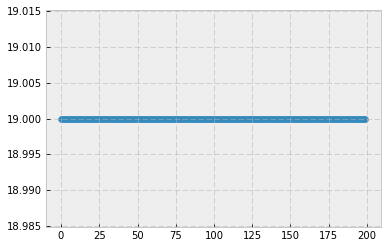

In [33]:
%matplotlib inline 
import matplotlib.pyplot as plt 
import pandas 
import numpy as np 

plt.style.use( 'bmh' )

x, y = [], []
with open( 'example_data.sam' ) as fn:
    for i, line in enumerate( fn.readlines() ):
        x.append( i )
        y.append( len( line.split() ) )
        
plt.scatter( x, y )

In [34]:
def map_qual_to_float( qual_letter ):
    # takes FASTQ qual letter 
    # returns a score between 0 and 1 
    qual_letters = '!"#$%&\'()*+,-./0123456789:;<=>?@ABCDEFGHIJKLMNOPQRSTUVWXYZ[\]^_`abcdefghijklmnopqrstuvwxyz{|}~'
    space = np.linspace( 0, 1, len( qual_letters ) )
    d = dict( zip( qual_letters, space ) ) 
    return d[ qual_letter ] 
    
map_qual_to_float( '~' )

1.0

In [39]:
cols = [
'zmw', # 1. 
'ignore', # 2. 
'ignore',# 3. 
'ignore',# 4. 
'ignore',# 5. 
'ignore',
'ignore',
'ignore',
'ignore',
'sequence', # 10. 
'qual', # 11. 
'read_group', # 12. 
'n_passes', # number of passes 
'read_quality',  # float, expected qual 
'rs', 
'signal_noise_base', # 15. 4 floats for the average signal-to-noise ratio of A, C, G, and T (in that order) over the HQRegion
'za', 
'zm', 
'zs', 
]
raw = pandas.read_csv( 'example_data.sam', sep='\s+', header=None, names=cols ) 
raw.sample( 5 ) 

,zmw,ignore,ignore.1,ignore.2,ignore.3,ignore.4,ignore.5,ignore.6,ignore.7,sequence,qual,read_group,n_passes,read_quality,rs,signal_noise_base,za,zm,zs
128,m54048_170205_013231/4719036/ccs,4,*,0,255,*,*,0,0,TGATGGAGTCTGGTCCTGGGCCTACCCTTCCTGTTTAAAGAAATCC...,D;?F'4VZKG<$.?JXR.PnS~b6$wQH=<~WT*_>;~~cTam4@e...,RG:Z:3143788c,np:i:15,rq:f:0.983143,"rs:B:i,16,0,0,0,5,0","sn:B:f,7.70016,13.6912,6.61825,10.1338",za:f:-21.4649,zm:i:4719036,"zs:B:f,-13.9407,-31.1084,-9.1144,-29.5601,-30...."
198,m54048_170205_013231/4850158/ccs,4,*,0,255,*,*,0,0,CTACTGGGACACGCACATTTTCAAAGACGATTTCTGCATGCCCATG...,~~Z~~?~~~~d}~~~~~(~~~~p~~~~~~~U~~~~~~~~~~~~~~~...,RG:Z:3143788c,np:i:12,rq:f:0.998779,"rs:B:i,14,0,0,0,0,0","sn:B:f,7.89178,15.064,5.67394,9.28827",za:f:4.28831,zm:i:4850158,"zs:B:f,5.27133,5.64517,4.5592,3.50791,4.28016,..."
96,m54048_170205_013231/4653323/ccs,4,*,0,255,*,*,0,0,TGGTGGAGTCTTCCTGGGCCTAGACGGCCTTGTGCGATTTCGAAAG...,~~~~~~~~~~~~~~~{~~~~~~~~~~~~~~~~~~~~~J~~~~~~~~...,RG:Z:3143788c,np:i:26,rq:f:0.998028,"rs:B:i,28,0,0,0,0,0","sn:B:f,6.53192,12.3102,4.81895,7.85503",za:f:2.68137,zm:i:4653323,"zs:B:f,3.33557,3.69819,3.39763,3.86952,3.47676..."
19,m54048_170205_013231/4326059/ccs,4,*,0,255,*,*,0,0,CAGTATAACCCAAAATTCCCTTCATGGTAGTCTCAGATGCAGCCCT...,~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~...,RG:Z:3143788c,np:i:57,rq:f:1,"rs:B:i,59,0,0,0,0,0","sn:B:f,4.89244,9.29976,4.26892,6.89765",za:f:6.88823,zm:i:4326059,"zs:B:f,7.30962,6.6079,7.25817,6.17947,6.83232,..."
84,m54048_170205_013231/4588062/ccs,4,*,0,255,*,*,0,0,CCCTGATGTCAAGGTATCCTCTTGTCTGCATGCACAAATCAACCAC...,[~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~...,RG:Z:3143788c,np:i:39,rq:f:1,"rs:B:i,41,0,0,0,0,0","sn:B:f,5.52989,10.4692,5.71574,9.27495",za:f:5.20424,zm:i:4588062,"zs:B:f,5.75718,5.42635,6.54261,5.29649,4.7589,..."


In [44]:
def plot_sequence_with_qual( sequence, quality, name ):
    
    rng = range( len( sequence ) ) 
    qual_scores = list( map( map_qual_to_float, quality ) )
    
    fig, ax = plt.subplots( figsize=( len( sequence ) * 0.3, 2 ) )
    ax.set_xticks( rng ) 
    ax.set_xticklabels( sequence )
    ax.set_xlim( -1, len( rng ) )
    ax.set_title( name, loc='left' ) 

    bases = 'ATCG'
    for base in bases:
        base_list = []
        for bs, q in zip( sequence, quality ):
            if bs == base:
                base_list.append( map_qual_to_float( q ) ) 
            else:
                base_list.append( 0 )
                
        ax.plot( rng, base_list ) 
    
    ax.legend( bases, loc='upper left' ) 
    return fig  

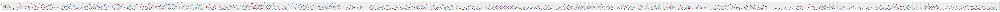

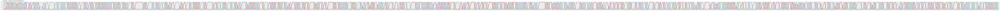

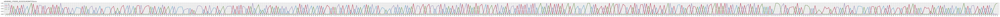

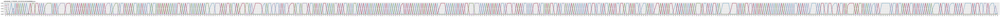

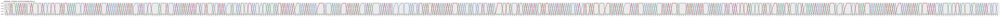

...

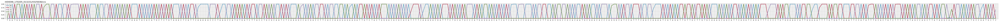

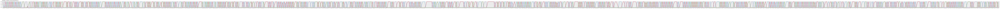

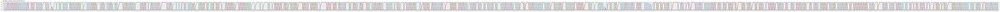

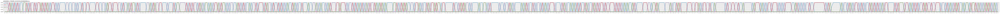

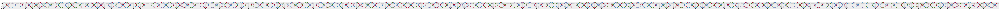

In [46]:
for idx, row in raw.iterrows():
    if idx < 20:
        fig = plot_sequence_with_qual( row.sequence, row.qual, row.zmw ) 

In [38]:
# naivlely compare 

